**This notebook shows how to run PixCuboid on the cuboid-shaped scenes of ScanNet++ v2 and 2D-3D-Semantics.**

In [1]:
%load_ext autoreload
%autoreload 2

import os

import torch
from omegaconf import OmegaConf
import rerun as rr
import rerun.blueprint as rrb

from pixloc.pixlib.datasets.scannetpp import ScanNet
from pixloc.pixlib.datasets.stanford2d3ds import Stanford2D3DS
from pixloc.pixlib.utils.tensor import batch_to_device, map_tensor
from pixloc.pixlib.utils.experiments import load_experiment
from pixloc.visualization.viz_2d import (
    plot_images, plot_keypoints, features_to_RGB, add_text)
from pixloc.visualization.rerun import (
    log_camera, log_cuboid, log_image, log_points)

os.environ['RERUN_NOTEBOOK_ASSET'] = 'inline'
torch.set_grad_enabled(False);
color_pred = torch.tensor([14, 154, 167]) / 255.
color_gt = torch.tensor([246, 205, 97]) / 255.

# Create a dataloader

### ScanNet++

In [2]:
conf = {
    'num_views': 5,
    'max_num_points3D': 256,
    'force_num_points3D': True,
    
    'resize': 512,
    'resize_by': 'min',
    'crop': False,  # 512 used during training
    
    'init_cuboid': 'cameras',  # 'ground_truth' used during training

    'read_line_segments': True,

    'render_edge_image': False,  # Enable to render edge images for pre-training
    
    'batch_size': 1,
    'seed': 1,
    'num_workers': 0,
}
split = 'val' # 'train', 'test'
loader = ScanNet(conf).get_data_loader(split, shuffle=True)

[06/10/2025 07:43:53 pixloc.pixlib.datasets.base_dataset INFO] Creating dataset ScanNet
[06/10/2025 07:43:53 pixloc.pixlib.datasets.scannetpp INFO] Reading info files
100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 58.16it/s]


### 2D-3D-Semantics

In [ ]:
conf = {
    'resize': 480,

    'read_line_segments': True,
    
    'batch_size': 1,
    'seed': 1,
    'num_workers': 0,
}
loader = Stanford2D3DS(conf).get_data_loader('test', shuffle=True)

# Load the training experiment

In [3]:
# Name of the example experiment. Replace with your own training experiment.
exp = 'pixcuboid_scannetpp'
device = 'cuda' if torch.cuda.is_available() else 'cpu'
conf = {
    'pre_optimize_vp': True,
    'optimizer': {
        'num_iters': 15,
        'edge_cost_scale': 0.05,
        'vp_cost_scale': 40.0,
    },
}
refiner = load_experiment(exp, conf).to(device)
print(OmegaConf.to_yaml(refiner.conf))

[06/10/2025 07:44:15 pixloc.pixlib.utils.experiments INFO] Loading checkpoint checkpoint_best.tar


name: cuboid_refiner
trainable: true
freeze_batch_normalization: false
extractor:
  name: dual_decoder_unet
  encoder: resnet101
  weights: IMAGENET1K_V2
  decoder:
  - 64
  - 64
  - 64
  - 32
  output_scales:
  - 0
  - 2
  - 4
  output_dim:
  - 32
  - 128
  - 128
  compute_uncertainty: true
  compute_edge_map: true
  compute_edge_uncertainty: true
  checkpointed: true
optimizer:
  name: cuboid_optimizer
  num_iters: 15
  loss_fn: scaled_barron(0, 0.1)
  edge_cost_scale: 0.05
  num_edge_points: 40
  clamp_dd: 0.25
  vp_cost_scale: 40.0
duplicate_optimizer_per_scale: true
success_thresh: 3
clamp_error: 50
normalize_features: true
normalize_dt: true
init_target_offset: null
pre_optimize_vp: true
vp_opt_dist_thr:
- 1
- 0.5
- 0.25
- 0.125
- 0.0625
vp_opt_cam_margin: 2.5
point_sampling: guided
num_points2D: 256
guided_sampling_exp: 4.0



# Run on a an example

### Run PixCuboid

In [17]:
# Setup logging function to store the optimization steps
cuboid_opt = []
def logging_fn(**args):
    cuboid_opt.append(args['cuboid'][0].detach().cpu())
for i in range(len(refiner.extractor.scales)):
    if refiner.conf.duplicate_optimizer_per_scale:
        opt = refiner.optimizer[i]
    else:
        opt = refiner.optimizer
    opt.logging_fn = logging_fn

# Run the cuboid refiner
data = next(iter(loader))
data_ = batch_to_device(data, device)
pred_ = refiner(data_)

if 'points3D' in data_:
    losses = refiner.loss(pred_, data_)
    mets = refiner.metrics(pred_, data_)

    # Print losses/metrics
    errP = f"ΔP {losses['warp_error/init'].item():.2f} -> {losses['warp_error'].item():.3f} px; "
    errR = f"ΔR {mets['rotation_error/init'].item():.2f} -> {mets['rotation_error'].item():.3f} deg; "
    errd = f"Δd {mets['3d_distance/init'].item():.2f} -> {mets['3d_distance'].item():.3f} m"
    print(errP, errR, errd)
    
pred = map_tensor(pred_, lambda x: x[0].cpu())
data = map_tensor(data, lambda x: x[0].cpu())

ΔP 44.53 -> 0.568 px;  ΔR 0.85 -> 0.385 deg;  Δd 1.23 -> 0.039 m


### Visualize inputs

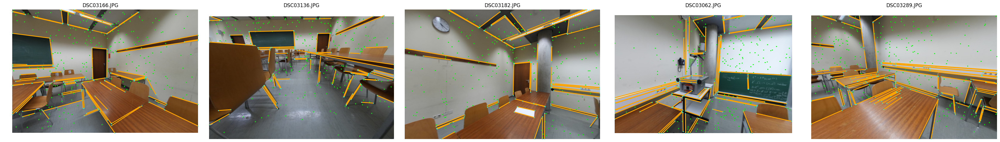

In [18]:
images, titles, keypoints, lines = [], [], [], []

for i in range(data['camera'].shape[0]):
    images.append(data['image'][i].permute(1, 2, 0))
    titles.append(data['name'][i][0])

    if 'points3D' in data:
        p3D = data['points3D'][i][data['p3D_mask'][i]]
        keypoints.append(data['camera'][i].world2image(data['T_w2cam'][i] * p3D)[0])

    if 'lines2D' in data:
        l2D = data['lines2D'][i][data['l2D_mask'][i]]
        lines.append(data['camera'][i].denormalize(l2D))

plot_images(images, titles=titles)
plot_keypoints(keypoints)
if 'lines2D' in data:
    try:
        from deeplsd.geometry.viz_2d import plot_lines
        plot_lines(lines, indices=list(range(data['lines2D'].shape[0])))
    except ImportError:
        pass

### Visualize feature maps

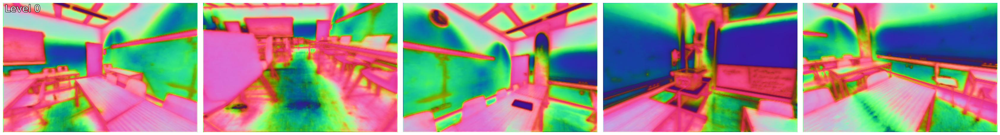

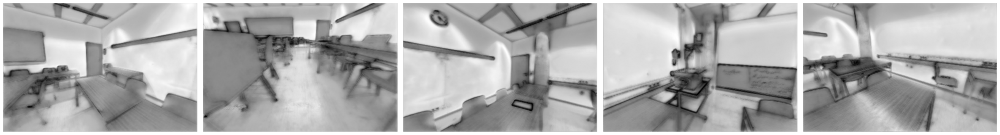

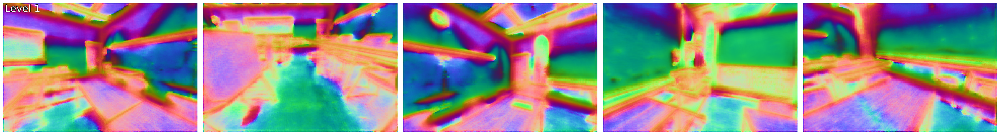

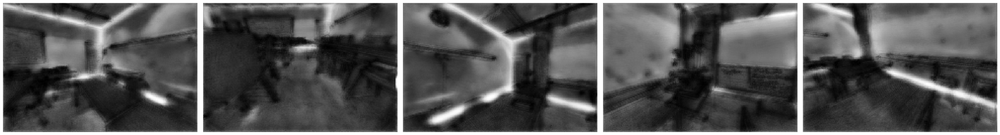

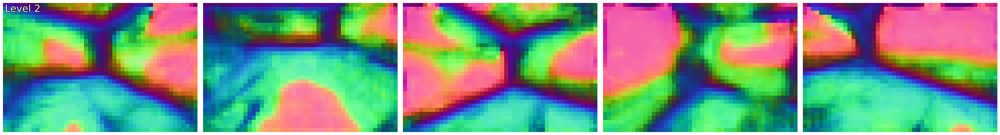

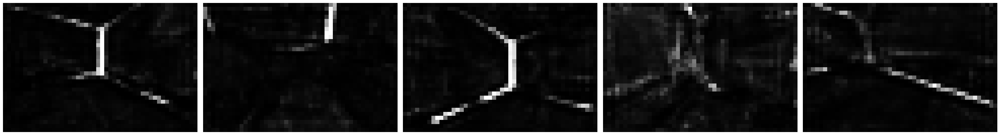

In [19]:
for i, (F, C) in enumerate(zip(pred['feature_maps'], pred['confidences'])):
    plot_images(features_to_RGB(*[f.numpy() for f in F]))
    add_text(0, f'Level {i}', fs=24)
    plot_images([c.permute(1, 2, 0) for c in C])

### Visualize edge maps

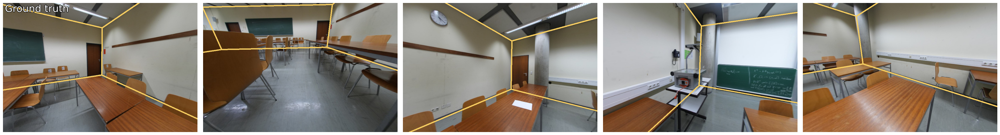

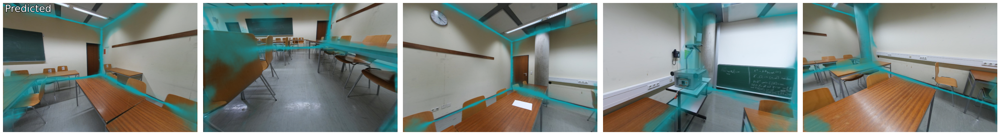

In [20]:
def mix_images(image, edge_map, color):
    return edge_map * image + (1.0 - edge_map) * torch.ones_like(image) * color[..., None, None]

if 'edge_image' in data:
    plot_images([mix_images(i, e, color_gt).permute(1, 2, 0) for i, e in zip(data['image'], data['edge_image'])])
    add_text(0, 'Ground truth', fs=24)

plot_images([mix_images(i, e, color_pred).permute(1, 2, 0) for i, e in zip(data['image'], pred['edge_maps'][0])])
add_text(0, 'Predicted', fs=24)

### Visualize optimization steps in 3D

In [21]:
rr.init('PixCuboid demo')
rr.send_blueprint(rrb.Blueprint(rrb.Spatial3DView()))

rr.set_time('step', sequence=-1)

log_cuboid('cuboid', data['cuboid_init'], color_pred)
log_cuboid('cuboid_gt', data['cuboid_gt'], color_gt)

for i in range(data['camera'].shape[0]):
    log_camera(f'camera{i}', data['camera'][i], data['T_w2cam'][i], image_plane_distance=0.2)
    log_image(f'camera{i}/image', data['image'][i].permute(1, 2, 0), opacity=0.5)

    if 'points3D' in data:
        p3D = data['points3D'][i][data['p3D_mask'][i]]
        log_points(f'points{i}', p3D, radii=0.02)

for i, c in enumerate(cuboid_opt):
    rr.set_time('step', sequence=i)
    log_cuboid('cuboid', c, color_pred)

rr.notebook_show(width=1024, height=768)

Viewer()